In [6]:
import pickle

nLabel, nTrial, nUser, nChannel, nTime  = 4, 40, 32, 40, 8064
no_of_users=32
path = "../Training Data/data_preprocessed_python/"
#to separate data from labels and create separate files for valence, arousal, dominance and liking.
def convertData():
    print("Program started"+"\n")
    fout_data = open(path+"features_raw.dat",'w')
    fout_labels0 = open(path+"labels_0.dat",'w')
    fout_labels1 = open(path+"labels_1.dat",'w')
    fout_labels2 = open(path+"labels_2.dat",'w')
    fout_labels3 = open(path+"labels_3.dat",'w')
    for i in range(no_of_users):  #nUser #4, 40, 32, 40, 8064 4 labels, 40 sample for each user, 32 such user, 40 electrode, 8064*40 features
        if(i%1 == 0):
            if i < 10:
                name = '%0*d' % (2,i+1)
            else:
                name = i+1
        fname = "s"+str(name)+".dat"     
        f = open(path+fname, 'rb')                 #Read the file in Binary mode
        x = pickle.load(f, encoding='latin1')
        print(fname)                          
    	
        for tr in range(nTrial):
            if(tr%1 == 0):
                for dat in range(nTime):
                    if(dat%32 == 0):
                        for ch in range(nChannel):
                            fout_data.write(str(x['data'][tr][ch][dat]) + " ");
                fout_labels0.write(str(x['labels'][tr][0]) + "\n");
                fout_labels1.write(str(x['labels'][tr][1]) + "\n");
                fout_labels2.write(str(x['labels'][tr][2]) + "\n");
                fout_labels3.write(str(x['labels'][tr][3]) + "\n");
                fout_data.write("\n");
    fout_labels0.close()
    fout_labels1.close()
    fout_labels2.close()
    fout_labels3.close()
    fout_data.close()
    print("\n"+"Print Successful")

if __name__ == '__main__':
    convertData()

Program started

s01.dat
s02.dat
s03.dat
s04.dat
s05.dat

Print Successful


In [7]:
import pickle

path = "../Training Data/data_preprocessed_python/"

nLabel, nTrial, nUser, nChannel, nTime  = 4, 40, 32, 40, 8064  #10080/80=126*40=5040 features
no_of_users=32
def sampleFeatures():
    print("Program started"+"\n")
    fout_data = open(path+'features_sampled.dat','w')
    for i in range(no_of_users):   #nUser  #4, 40, 32, 40, 8064
        if(i%1 == 0):
            if i < 10:			
                name = '%0*d' % (2,i+1)
            else:
                name = i+1		
            fname = "s"+str(name)+".dat"
            x = pickle.load(open(path+fname, 'rb'), encoding='latin1')		
            print(fname)		
            for tr in range(nTrial):			
                if(tr%1 == 0):				
                    for dat in range(nTime):					
                        if(dat%32 == 0 ):						
                            for ch in range(nChannel):							
                                fout_data.write(str(ch+1) + " ");							
                                fout_data.write(str(x['data'][tr][ch][dat]) + " ");			
                fout_data.write("\n");
    fout_data.close()
    print('Completed')

if __name__ == '__main__':
    sampleFeatures()

Program started

s01.dat
s02.dat
s03.dat
s04.dat
s05.dat
Completed


In [8]:
# to divide labels into classes so as to detrmine emotions later on
def onehotencoding0():
    print("Program started"+"\n")
    fout_labels_class = open(path+"label_class_0.dat",'w')
    
    with open(path+'labels_0.dat','r') as f:
        for val in f:
            if float(val) > 4.5:
                fout_labels_class.write(str(1) + "\n");
            else:
                fout_labels_class.write(str(0) + "\n");
                
    print("Encoded label 0"+"\n")
if __name__ == '__main__':
    onehotencoding0()

Program started

Encoded label 0



In [9]:
def onehotencoding1():
    print("Program started"+"\n")
    fout_labels_class = open(path+"label_class_1.dat",'w')
    
    with open(path+'labels_1.dat','r') as f:
        for val in f:
            if float(val) > 4.5:
                fout_labels_class.write(str(1) + "\n");
            else:
                fout_labels_class.write(str(0) + "\n");
    print("Encoded label 1"+"\n")
if __name__ == '__main__':
    onehotencoding1()

Program started

Encoded label 1



In [10]:
def onehotencoding2():
    print("Program started"+"\n")
    fout_labels_class = open(path+"label_class_2.dat",'w')
    
    with open(path+'labels_2.dat','r') as f:
        for val in f:
            if float(val) > 4.5:
                fout_labels_class.write(str(1) + "\n");
            else:
                fout_labels_class.write(str(0) + "\n");
    print("Encoded label 2"+"\n")
if __name__ == '__main__':
    onehotencoding2()

Program started

Encoded label 2



In [11]:
def onehotencoding3():
    print("Program started"+"\n")
    fout_labels_class = open(path+"label_class_3.dat",'w')
    
    with open(path+'labels_3.dat','r') as f:
        for val in f:
            if float(val) > 4.5:
                fout_labels_class.write(str(1) + "\n");
            else:
                fout_labels_class.write(str(0) + "\n");
    print("Encoded label 3"+"\n")
if __name__ == '__main__':
    onehotencoding3()

Program started

Encoded label 3



In [12]:
import numpy
import pandas
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import warnings
import time
start = time. time()
path = "../Training Data/data_preprocessed_python/"

def knn_classifier_lda():
    warnings.filterwarnings("ignore")
    file_x = 'features_raw.dat'
    file_y = 'label_class_0.dat'
    
    X = numpy.genfromtxt(path+file_x, delimiter=' ')
    y = numpy.genfromtxt(path+file_y, delimiter=' ')
    
    # Split the data into training/testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    
    # Feature Scaling
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    X_train = sc.fit_transform(numpy.nan_to_num(X_train))
    X_test = sc.transform(numpy.nan_to_num(X_test))
    
    #linear discriminant analysis
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    lda = LinearDiscriminantAnalysis()
    X_train = lda.fit_transform(X_train,y_train)
    print(len(X_train[0]))
    X_test = lda.fit_transform(X_test,y_test)
   
    # KNN classsifier
    clf = KNeighborsClassifier(n_neighbors=33)
    #trained_model=clf.fit(X_train,y_train)
    #trained_model.fit(X_train,y_train )
    
    #clf.fit(train_read[1,-1], y_train)
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_predict)
    print(cm)
    
    print("Accuracy score of valence test KNN-LDA")
    
    print(accuracy_score(y_test, y_predict)*100)
    
    ############################################################################################
    
    y_test_0_file = open(path+"y_test_0.dat",'w')
    for i in range(len(y_test)):
        y_test_0_file.write(str(y_test[i]) + "\n")
    y_test_0_file.close()
        
          
    y_predict_0_file = open(path+"y_predict_0.dat",'w')
    for i in range(len(y_test)):
        y_predict_0_file.write(str(y_predict[i]) + "\n")
    y_predict_0_file.close()
    
    ###############################################################################################

    
    ########################################################################3
    file_x = 'features_raw.dat'
    file_y = 'label_class_1.dat'
    
    X = numpy.genfromtxt(path+file_x, delimiter=' ')
    y = numpy.genfromtxt(path+file_y, delimiter=' ')
    
    # Split the data into training/testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    
    # Feature Scaling
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
    
    #linear discriminant analysis
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    lda = LinearDiscriminantAnalysis(n_components=25)
    X_train = lda.fit_transform(X_train,y_train)
    X_test = lda.fit_transform(X_test,y_test)
        	
    # KNN classsifier
    clf = KNeighborsClassifier(n_neighbors=5)
    trained_model=clf.fit(X_train,y_train)
    trained_model.fit(X_train,y_train )
    
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_predict)
    print(cm)
    
    print("Accuracy score of Arousal test KNN-LDA")
    print(accuracy_score(y_test, y_predict)*100)
    
        ############################################################################################
    
    y_test_1_file = open(path+"y_test_1.dat",'w')
    for i in range(len(y_test)):
        y_test_1_file.write(str(y_test[i]) + "\n")
    y_test_1_file.close()
        
          
    y_predict_1_file = open(path+"y_predict_1.dat",'w')
    for i in range(len(y_test)):
        y_predict_1_file.write(str(y_predict[i]) + "\n")
    y_predict_1_file.close()
    
    ###############################################################################################


    
    
    ##########################################################################
    file_x = 'features_raw.dat'
    file_y = 'label_class_2.dat'
    
    X = numpy.genfromtxt(path+file_x, delimiter=' ')
    y = numpy.genfromtxt(path+file_y, delimiter=' ')
    
    # Split the data into training/testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    
    # Feature Scaling
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
    
    #linear discriminant analysis
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    lda = LinearDiscriminantAnalysis(n_components=25)
    X_train = lda.fit_transform(X_train,y_train)
    X_test = lda.fit_transform(X_test,y_test)
           	
    # KNN classsifier
    clf = KNeighborsClassifier(n_neighbors=5)
    trained_model=clf.fit(X_train,y_train)
    trained_model.fit(X_train,y_train )
    
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_predict)
    print(cm)
    
    print("Accuracy score of Dominance test KNN-LDA")
    print(accuracy_score(y_test, y_predict)*100)
    
        ############################################################################################
    
    y_test_2_file = open(path+"y_test_2.dat",'w')
    for i in range(len(y_test)):
        y_test_2_file.write(str(y_test[i]) + "\n")
    y_test_2_file.close()
        
          
    y_predict_2_file = open(path+"y_predict_2.dat",'w')
    for i in range(len(y_test)):
        y_predict_2_file.write(str(y_predict[i]) + "\n")
    y_predict_2_file.close()
    
    ###############################################################################################


       
    ######################################################################
    file_x = 'features_raw.dat'
    file_y = 'label_class_3.dat'
    
    X = numpy.genfromtxt(path+file_x, delimiter=' ')
    y = numpy.genfromtxt(path+file_y, delimiter=' ')
    
    # Split the data into training/testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    
    # Feature Scaling
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
    
    #linear discriminant analysis
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    lda = LinearDiscriminantAnalysis(n_components=8)
    X_train = lda.fit_transform(X_train,y_train)
    X_test = lda.fit_transform(X_test,y_test)
       
    # KNN classsifier
    clf = KNeighborsClassifier(n_neighbors=5)
    trained_model=clf.fit(X_train,y_train)
    trained_model.fit(X_train,y_train )
    
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_predict)
    print(cm)
    
    print("Accuracy score of Liking test KNN-LDA")
    print(accuracy_score(y_test, y_predict)*100)
    
        ############################################################################################
    
    y_test_0_file = open(path+"y_test_3.dat",'w')
    for i in range(len(y_test)):
        y_test_0_file.write(str(y_test[i]) + "\n")
    y_test_0_file.close()
        
          
    y_predict_3_file = open(path+"y_predict_3.dat",'w')
    for i in range(len(y_test)):
        y_predict_3_file.write(str(y_predict[i]) + "\n")
    y_predict_3_file.close()
    
    ###############################################################################################

       
    
if __name__ == '__main__':
    knn_classifier_lda()
    end = time. time()
    print(end - start)

1
[[17  2]
 [ 1 20]]
Accuracy score of valence test KNN-LDA
92.5
[[14  5]
 [ 2 19]]
Accuracy score of Arousal test KNN-LDA
82.5
[[14  5]
 [ 3 18]]
Accuracy score of Dominance test KNN-LDA
80.0
[[10  3]
 [ 2 25]]
Accuracy score of Liking test KNN-LDA
87.5
23.67091202735901


In [11]:
len(X_train[0])

NameError: name 'X_train' is not defined

In [4]:
def Russell_circumplex():
    yy_test_0=[]
    
    with open(path+'y_test_0.dat','r') as f:
        for val in f:
            
            if str(val) == '0.0\n':
                yy_test_0.append(0)
            if str(val) == '1.0\n':
                yy_test_0.append(1)
                
    f.close()
        
    yy_test_1=[]
    
    with open(path+'y_test_1.dat','r') as f:
        for val in f:
            if str(val) == '0.0\n':
                yy_test_1.append(0)
            if str(val) == '1.0\n':
                yy_test_1.append(1)
    f.close()
        
    yy_predict_0=[]
    
    with open(path+'y_predict_0.dat','r') as f:
        for val in f:
            if str(val) == '0.0\n':
                yy_predict_0.append(0)
            if str(val) == '1.0\n':
                yy_predict_0.append(1)
    f.close()
        
    yy_predict_1=[]
    
    with open(path+'y_predict_1.dat','r') as f:
        for val in f:
            if str(val) == '0.0\n':
                yy_predict_1.append(0)
            if str(val) == '1.0\n':
                yy_predict_1.append(1)
            
        f.close()
        
            
    
    print("\n Program Started for Russell circumplex ")
    emotion_present=[]
    for i in range(len(yy_test_0)):
        if yy_test_0[i] == 0 and yy_test_1[i] == 0:
            emotion_present.append("Depressed")
        elif yy_test_0[i] == 0 and yy_test_1[i] == 1:
            emotion_present.append("Nervous")
            
        elif yy_test_0[i] == 1 and yy_test_1[i] == 0:
            emotion_present.append("Relaxed")
            
        else:
            emotion_present.append("Happy")
    print("\n Actual Emotion Present:  ")
            
    print(emotion_present)
    
    eemotion_present_file = open(path+"emotion_present.dat",'w')
    for i in range(len(yy_test_0)):
        eemotion_present_file.write(str(emotion_present[i]) + '\n')
    eemotion_present_file.close()
    
       
    emotion_predicted=[]
    for i in range(len(yy_predict_0)):
        if yy_predict_0[i] == 0 and yy_predict_1[i] == 0:
            emotion_predicted.append("Depressed")
        elif yy_predict_0[i] == 0 and yy_predict_1[i] == 1:
            emotion_predicted.append("Nervous")
            
        elif yy_predict_0[i] == 1 and yy_predict_1[i] == 0:
            emotion_predicted.append("Relaxed")
            
        else:
            emotion_predicted.append("Happy")
    print("\n Emotion Predicted:  ")
            
    print(emotion_predicted)
    
    eemotion_predicted_file = open(path+"emotion_predicted.dat",'w')
    for i in range(len(yy_test_0)):
        eemotion_predicted_file.write(str(emotion_predicted[i]) + '\n')
    eemotion_predicted_file.close()
    print("*******************************************************")
    print(str(yy_predict_0[2]))
    print(str(yy_predict_1[2]))
    
if __name__ == '__main__':
    Russell_circumplex()
    


 Program Started for Russell circumplex 

 Actual Emotion Present:  
['Happy', 'Depressed', 'Depressed', 'Happy', 'Depressed', 'Happy', 'Happy', 'Nervous', 'Happy', 'Relaxed', 'Happy', 'Relaxed', 'Happy', 'Relaxed', 'Happy', 'Happy', 'Happy', 'Nervous', 'Nervous', 'Happy', 'Happy', 'Nervous', 'Relaxed', 'Happy', 'Happy', 'Happy', 'Nervous', 'Happy', 'Nervous', 'Depressed', 'Happy', 'Happy', 'Relaxed', 'Relaxed', 'Happy', 'Nervous', 'Happy', 'Relaxed', 'Happy', 'Nervous', 'Happy', 'Happy', 'Relaxed', 'Happy', 'Depressed', 'Relaxed', 'Relaxed', 'Relaxed', 'Depressed', 'Relaxed', 'Happy', 'Happy', 'Relaxed', 'Happy', 'Relaxed', 'Happy', 'Depressed', 'Depressed', 'Happy', 'Relaxed', 'Nervous', 'Relaxed', 'Depressed', 'Relaxed', 'Relaxed', 'Nervous', 'Nervous', 'Relaxed', 'Relaxed', 'Happy', 'Happy', 'Nervous', 'Happy', 'Depressed', 'Nervous', 'Happy', 'Nervous', 'Nervous', 'Relaxed', 'Happy', 'Happy', 'Happy', 'Nervous', 'Nervous', 'Happy', 'Relaxed', 'Happy', 'Happy', 'Happy', 'Happy', '

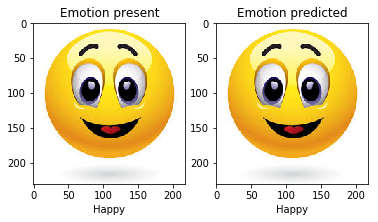

pygame 1.9.4
Hello from the pygame community. https://www.pygame.org/contribute.html


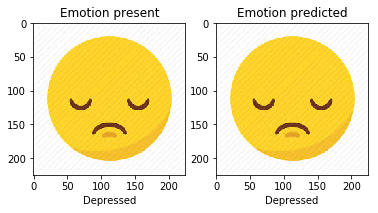

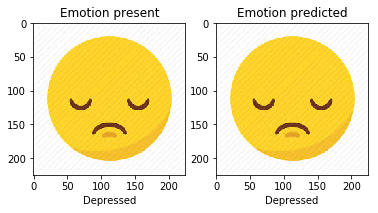

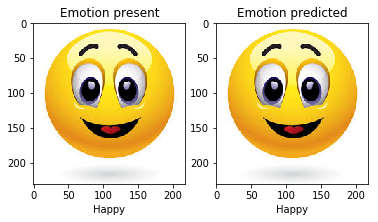

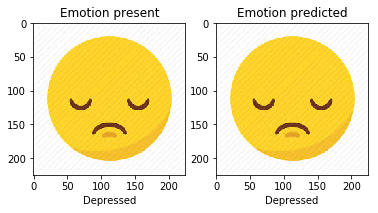

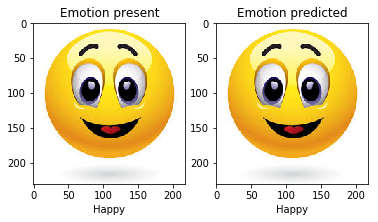

...

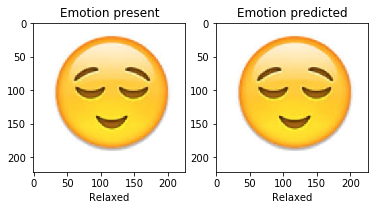

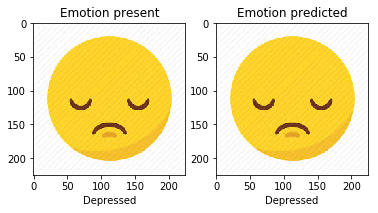

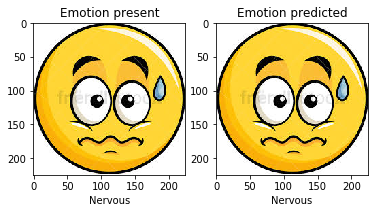

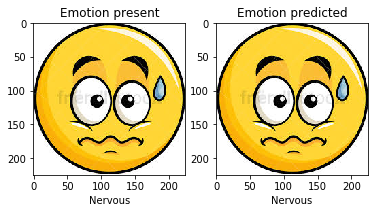

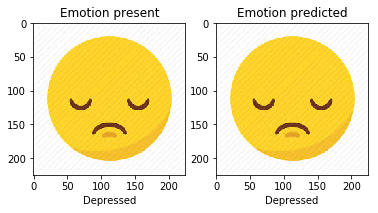

In [2]:
def Display_emotion():
    
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    import numpy as np
    import time
    
    path = "../Training Data/data_preprocessed_python/"
    eemotion_present=[]
    
    with open(path+'emotion_present.dat','r') as f:
        for val in f:
            if str(val) == 'Relaxed\n':
                eemotion_present.append('Relaxed')
            elif str(val) == 'Happy\n':
                eemotion_present.append('Happy')
            elif str(val) == 'Depressed\n':
                eemotion_present.append('Depressed')
            else:
            
                eemotion_present.append('Nervous')
            
        
    f.close()
    
    eemotion_predicted=[]
    
    with open(path+'emotion_predicted.dat','r') as f:
        for val in f:
            if str(val) == 'Relaxed\n':
                eemotion_predicted.append('Relaxed')
            elif str(val) == 'Happy\n':
                eemotion_predicted.append('Happy')
            elif str(val) == 'Depressed\n':
                eemotion_predicted.append('Depressed')
            else:
            
                eemotion_predicted.append('Nervous')
            
        
    f.close()
            
               
    img1 = mpimg.imread('image1.jpg')
    img2 = mpimg.imread('image2.jpg')
    img3 = mpimg.imread('image3.jpg')
    img4 = mpimg.imread('image4.jpg')
    
    plt.figure(1)
    
    
    for i in range(len(eemotion_present)):
        plt.subplot(121)
        if eemotion_present[i] == "Happy":
                   
            plt.imshow(img1)
            plt.title("Emotion present")
            plt.xlabel("Happy")
             
            
        elif eemotion_present[i] == "Nervous":
            plt.imshow(img2)
            plt.title("Emotion present")
            plt.xlabel("Nervous")

        elif eemotion_present[i] == "Depressed":
            plt.imshow(img3)
            plt.title("Emotion present")
            plt.xlabel("Depressed")
            from pygame import mixer
        
        else:
            plt.imshow(img4)
            plt.title("Emotion present")
            plt.xlabel("Relaxed")
            
             
        plt.subplot(122)
    
        if eemotion_predicted[i] == "Happy":
                   
            plt.imshow(img1)
            plt.title("Emotion predicted")
            plt.xlabel("Happy")
            
        elif eemotion_predicted[i] == "Nervous":
            plt.imshow(img2)
            plt.title("Emotion predicted")
            plt.xlabel("Nervous")
            
        elif eemotion_predicted[i] == "Depressed":
            plt.imshow(img3)
            plt.title("Emotion predicted")
            plt.xlabel("Depressed")
        
        else:
            plt.imshow(img4)
            plt.title("Emotion predicted")
            plt.xlabel("Relaxed")
    
        plt.show()
        
        """
        if eemotion_present[i] == "Happy":
            from pygame import mixer
            mixer.init()
            mixer.music.load("happy.mp3")
            time.sleep(2)
            mixer.music.play()
            time.sleep(10)
            
        elif eemotion_present[i] == "Nervous":
            from pygame import mixer
            mixer.init()
            mixer.music.load("nervous.mp3")
            time.sleep(2)
            mixer.music.play()
            time.sleep(10)
        
        elif eemotion_present[i] == "Depressed":
            from pygame import mixer
            mixer.init()
            mixer.music.load("depressed.mp3")
            time.sleep(2)
            mixer.music.play()
            time.sleep(10)
            
        else:
            from pygame import mixer
            mixer.init()
            mixer.music.load("realaxed.mp3")
            time.sleep(2)
            mixer.music.play()
            time.sleep(10)
        """

if __name__ == '__main__':
    Display_emotion()

In [ ]:
mixer.music.close()